<h1 style='background:#483D8B; border:2; border-radius: 10px; font-size:250%; font-weight: bold; color:white'><center>Fetal Health Classification</center></h1>

<div style="border-radius:10px;
            border :#483D8B solid;
            background-color:#B0C4DE;
           font-size:110%;
            text-align: left">
    
## <h2 style='border:0; color:black'><center>About the data (Description of attributes)</center></h2>

**This dataset contains 2126 records of features extracted from Cardiotocogram exams, which were then classified by expert obstetrician into 3 classes: "Normal", "Suspect" & "Pathological". Dataset having the following features:**  
    
* **baseline value:** Baseline Fetal Heart Rate (FHR) (beats per minute)   
* **accelerations:** Number of accelerations per second
* **fetal_movement:** Number of fetal movements per second    
* **uterine_contractions:** Number of uterine contractions per second
* **light_decelerations:** Number of light decelerations (LDs) per second
* **severe_decelerations:** Number of severe decelerations (SDs) per second
* **prolongued_decelerations:** Number of prolonged decelerations (PDs) per second
* **abnormal_short_term_variability:** Percentage of time with abnormal short term variability
* **mean_value_of_short_term_variability:** Mean value of short term variability
* **percentage_of_time_with_abnormal_long_term_variability:** Percentage of time with abnormal long term variability
* **mean_value_of_long_term_variability:** Mean value of long term variability
* **histogram_width:** Width of histogram made using all values from a record 
* **histogram_min:** Histogram minimum value 
* **histogram_max:** Histogram maximum value 
* **histogram_number_of_peaks:** Number of peaks in the exam histogram 
* **histogram_number_of_zeroes:** Number of zeros in the exam histogram 
* **histogram_mode:** Histogram mode
* **histogram_mean:** Histogram mean
* **histogram_median:** Histogram median
* **histogram_variance:** Histogram variance
* **histogram_tendency:** Histogram tendency
* **fetal_health:** Encoded as 1-Normal; 2-Suspect; 3-Pathological. <mark>It is our very target column in the dataset.</mark>

### **<span style="color:#483D8B;">important libraries</span>**

In [1]:
def warn(*args,**kwargs):
    pass
import warnings
warnings.warn = warn

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold,RepeatedStratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, plot_confusion_matrix, precision_recall_fscore_support,roc_auc_score,classification_report 

### **<span style="color:#483D8B;">import data</span>**

In [2]:
data = pd.read_csv('./IDS_Assignment/fetal_health.csv')


# **<span style="color:#483D8B;">EDA</span>**

In [3]:
data.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


In [4]:
data.fetal_health.value_counts()

1.0    1655
2.0     295
3.0     176
Name: fetal_health, dtype: int64

In [5]:
df_nunique = pd.DataFrame([[i, data[i].nunique()] for i in data.columns],columns=['column','nunique']).set_index('column')
df_nunique

,nunique
column,
baseline value,48
accelerations,20
fetal_movement,102
uterine_contractions,16
light_decelerations,16
severe_decelerations,2
prolongued_decelerations,6
abnormal_short_term_variability,75
mean_value_of_short_term_variability,57


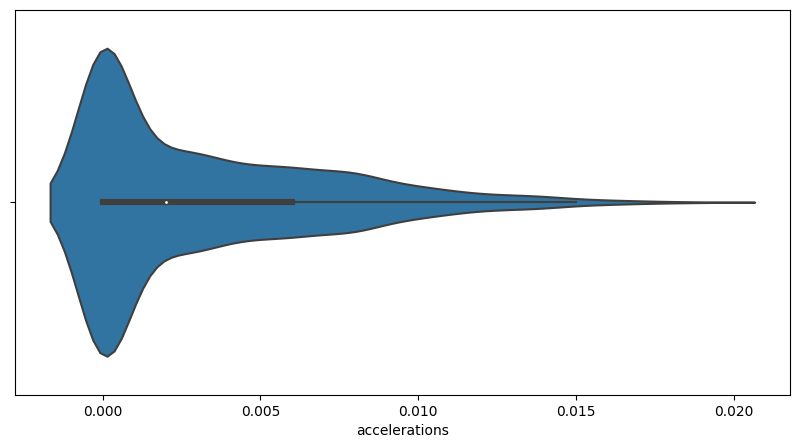

In [6]:
plt.figure(figsize = (10,5))
ax= sns.violinplot(data['accelerations'])
plt.show()

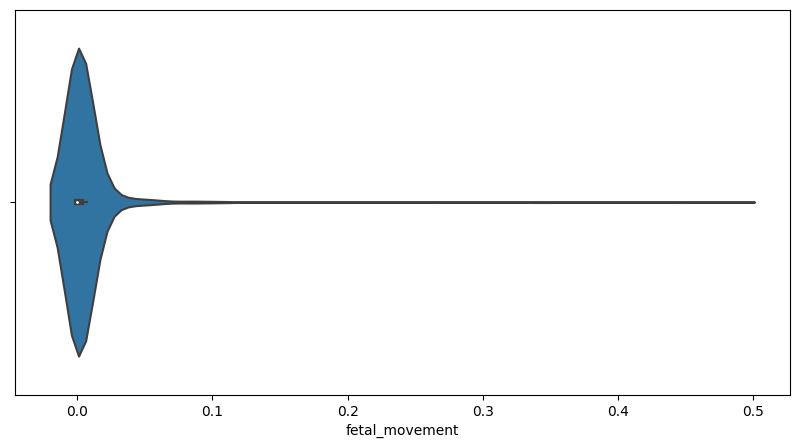

In [7]:
plt.figure(figsize = (10,5))
ax= sns.violinplot(data['fetal_movement'])
plt.show()

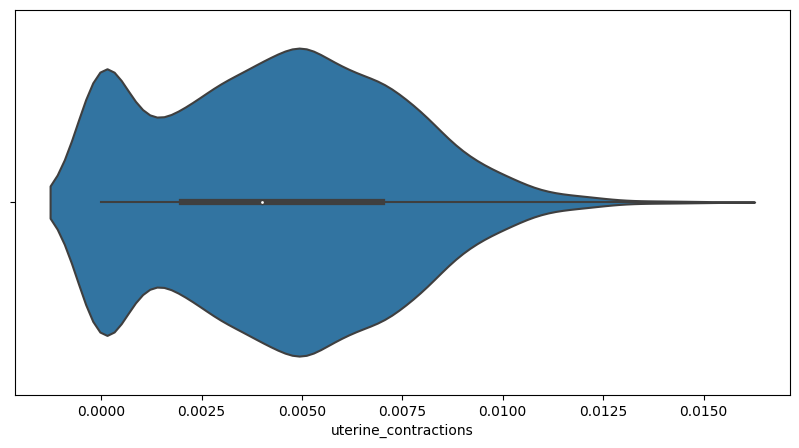

In [8]:
plt.figure(figsize = (10,5))
ax= sns.violinplot(data['uterine_contractions'])
plt.show()

In [9]:
data.describe()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
count,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.00000,...,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000
mean,133.303857,0.003178,0.009481,0.004366,0.001889,0.000003,0.000159,46.990122,1.332785,9.84666,...,93.579492,164.025400,4.068203,0.323612,137.452023,134.610536,138.090310,18.808090,0.320320,1.304327
std,9.840844,0.003866,0.046666,0.002946,0.002960,0.000057,0.000590,17.192814,0.883241,18.39688,...,29.560212,17.944183,2.949386,0.706059,16.381289,15.593596,14.466589,28.977636,0.610829,0.614377
min,106.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,0.200000,0.00000,...,50.000000,122.000000,0.000000,0.000000,60.000000,73.000000,77.000000,0.000000,-1.000000,1.000000
25%,126.000000,0.000000,0.000000,0.002000,0.000000,0.000000,0.000000,32.000000,0.700000,0.00000,...,67.000000,152.000000,2.000000,0.000000,129.000000,125.000000,129.000000,2.000000,0.000000,1.000000
50%,133.000000,0.002000,0.000000,0.004000,0.000000,0.000000,0.000000,49.000000,1.200000,0.00000,...,93.000000,162.000000,3.000000,0.000000,139.000000,136.000000,139.000000,7.000000,0.000000,1.000000
75%,140.000000,0.006000,0.003000,0.007000,0.003000,0.000000,0.000000,61.000000,1.700000,11.00000,...,120.000000,174.000000,6.000000,0.000000,148.000000,145.000000,148.000000,24.000000,1.000000,1.000000
max,160.000000,0.019000,0.481000,0.015000,0.015000,0.001000,0.005000,87.000000,7.000000,91.00000,...,159.000000,238.000000,18.000000,10.000000,187.000000,182.000000,186.000000,269.000000,1.000000,3.000000


**Minor Observation:** Attributes such as severe_decelerations,prolongues_decelerations are more or less constant with few variation. We may remove those. will taken care of these in Dimensionality Reduction.

In [10]:
data.isnull().sum()

baseline value                                            0
accelerations                                             0
fetal_movement                                            0
uterine_contractions                                      0
light_decelerations                                       0
severe_decelerations                                      0
prolongued_decelerations                                  0
abnormal_short_term_variability                           0
mean_value_of_short_term_variability                      0
percentage_of_time_with_abnormal_long_term_variability    0
mean_value_of_long_term_variability                       0
histogram_width                                           0
histogram_min                                             0
histogram_max                                             0
histogram_number_of_peaks                                 0
histogram_number_of_zeroes                                0
histogram_mode                          

There is no null value let's proceed further to check class blancing

Text(0.5, 1.0, 'Number of samples of each class')

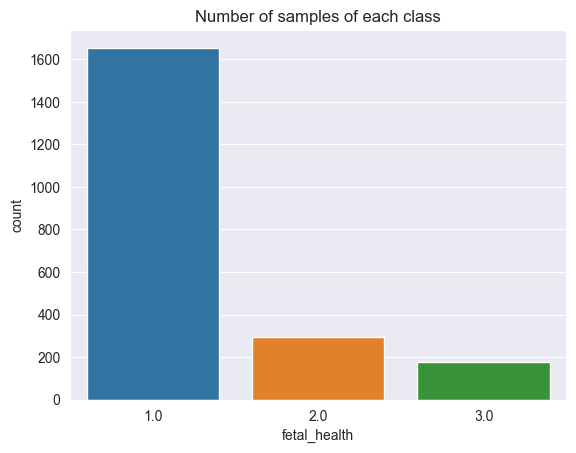

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style(style='darkgrid')
sns.countplot(data=data,x='fetal_health')
plt.title("Number of samples of each class")

Observation: An highly Imbalanced Dataset. Which is obvious as Normal would be dominant.

Solution: Oversampling of the minority classes. To make better predictions.(Will perform later in the notebook)

In [12]:
data1 = data.copy()
data1.fetal_health = data1.fetal_health.astype('int')
data1.fetal_health = data1.fetal_health.replace([1,2,3],['Normal','Suspect','Pathological'])

([<matplotlib.patches.Wedge at 0x22e6bc92680>,
 [Text(-0.8441562311892146, 0.7052660897451555, 'Normal'),
  Text(0.6344062353380878, -0.8986260226390926, 'Suspect'),
  Text(1.0630076905865578, -0.28286860863983, 'Pathological')],
 [Text(-0.4604488533759351, 0.38469059440644837, '78%'),
  Text(0.3460397647298661, -0.4901596487122323, '14%'),
  Text(0.5798223766835768, -0.15429196834899814, '8%')])

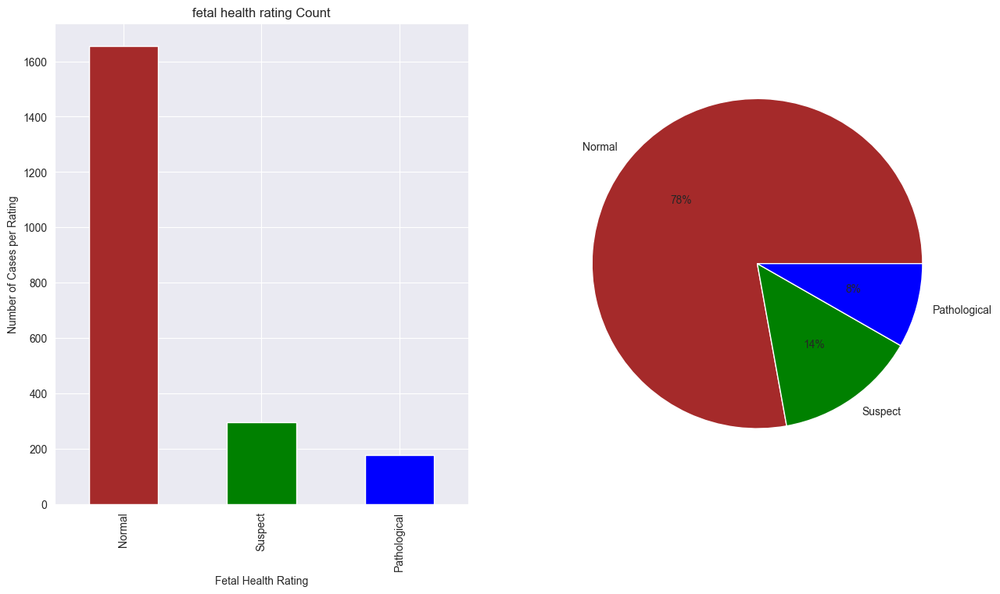

In [13]:
plt.figure(figsize=(15,8))
plt.subplot(121)
data1.fetal_health.value_counts().plot(kind='bar',figsize=(15,8),color = ['brown','g','b'])
plt.title('fetal health rating Count')
plt.xlabel('Fetal Health Rating')
plt.ylabel('Number of Cases per Rating')

plt.subplot(122)
plt.pie(data1.fetal_health.value_counts(),labels=[
    'Normal', 'Suspect', 'Pathological'], colors = ['brown', 'g', 'b'], autopct='%1.0f%%')

### **<span style="color:#483D8B;">Define Function</span>**

In [14]:
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(X_train)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test)))

In [15]:
from sklearn import tree
def get_dt_graph(dt_classifier):
    fig = plt.figure(figsize=(80,80))
    _ = tree.plot_tree(dt_classifier,
                       feature_names=X.columns,
                       class_names=['Normal', "Suspect",'Pathological'],
                       filled=True,fontsize=14)

### **<span style="color:#483D8B;">Train/Test Split</span>**

In [16]:
X = data.drop('fetal_health',axis=1)
y = data.fetal_health
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.30)  ## 70:30 split

<AxesSubplot:>

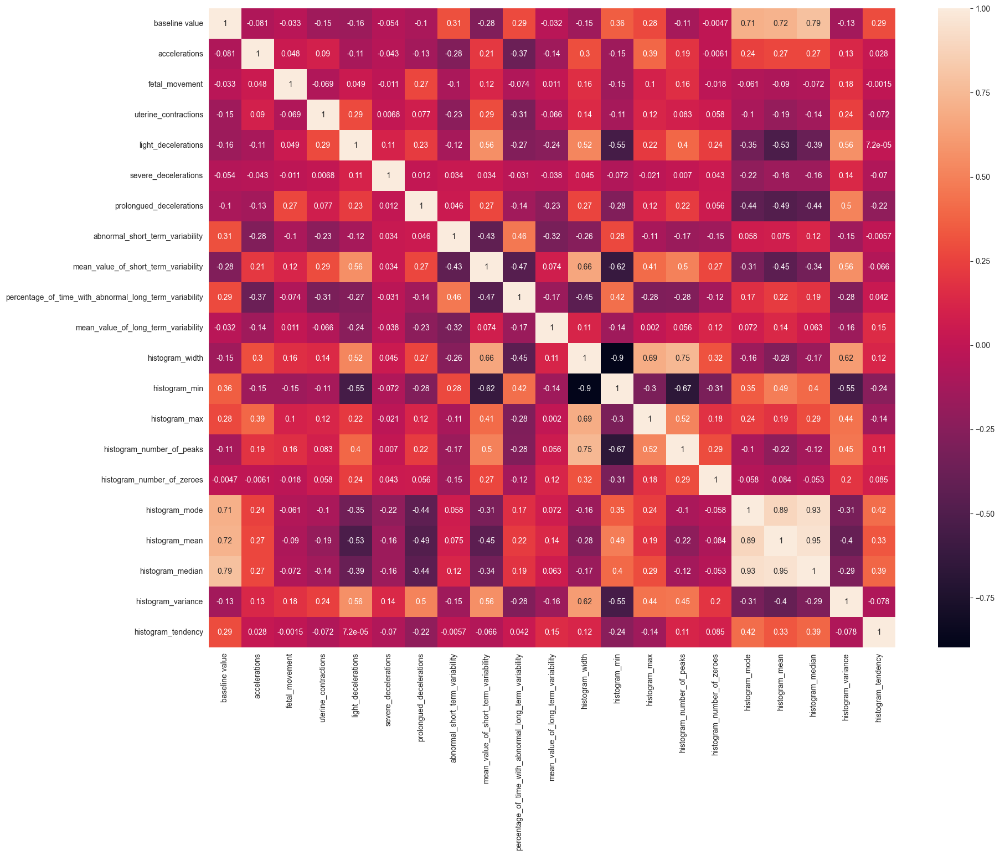

In [17]:
corr=X.corr()
plt.figure(figsize=(20,15))
sns.heatmap(corr,annot=True)

**<span style="color:#483D8B;">Observations: > histogram mean,median,mode have high correlations.The distribution may towards normal.</span>**

In [18]:
grouped=data.groupby(by='fetal_health').mean()
grouped

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency
fetal_health,,,,,,,,,,,,,,,,,,,,,
1.0,131.981873,0.003992,0.007963,0.004781,0.001941,6.042296e-07,0.000051,42.465861,1.430634,5.044713,...,73.400000,91.085801,164.485801,4.163142,0.335347,138.258610,135.102115,138.459819,17.479758,0.341994
2.0,141.684746,0.000275,0.008332,0.002390,0.000536,0.000000e+00,0.000095,61.901695,0.638983,29.030508,...,49.159322,113.294915,162.454237,3.311864,0.244068,146.555932,144.759322,147.071186,7.213559,0.433898
3.0,131.687500,0.000392,0.025676,0.003784,0.003670,3.409091e-05,0.001273,64.539773,1.575568,22.846591,...,78.346591,83.982955,162.329545,4.443182,0.346591,114.607955,112.977273,119.562500,50.732955,-0.073864


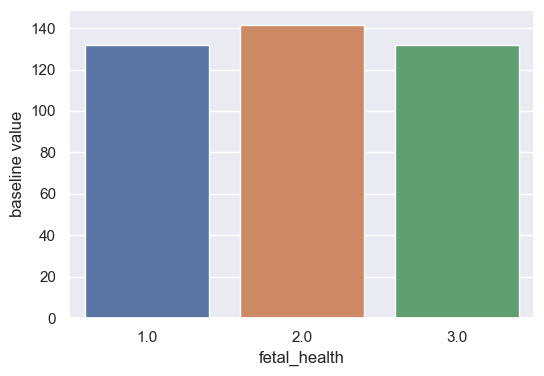

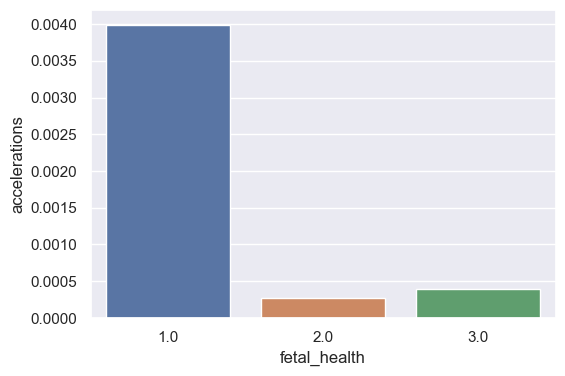

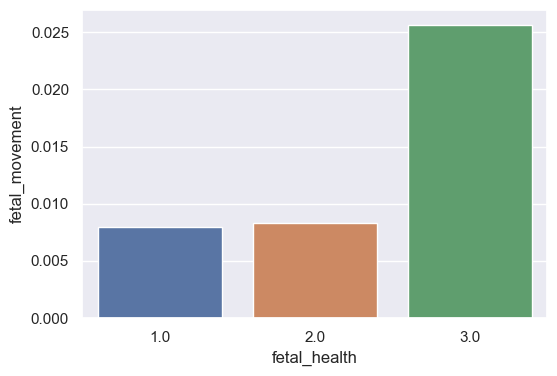

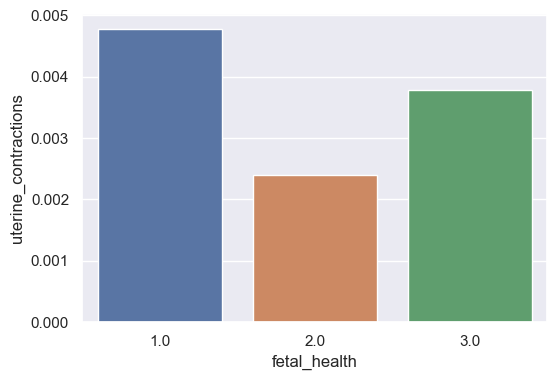

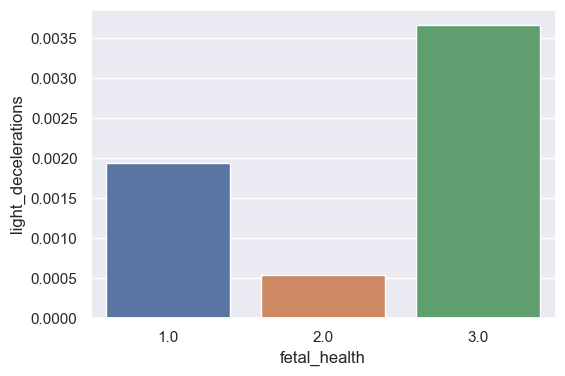

...

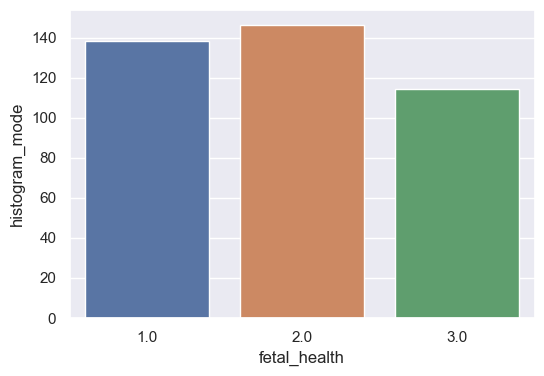

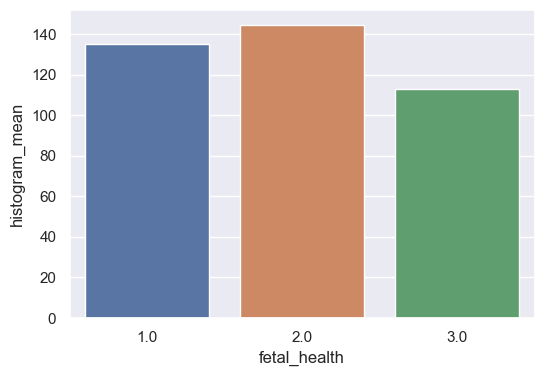

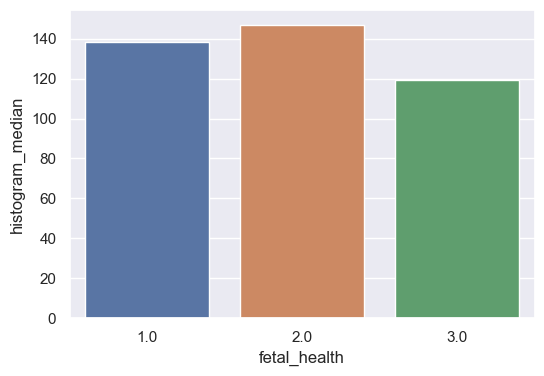

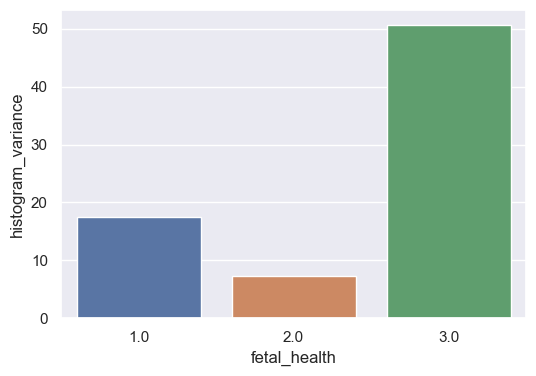

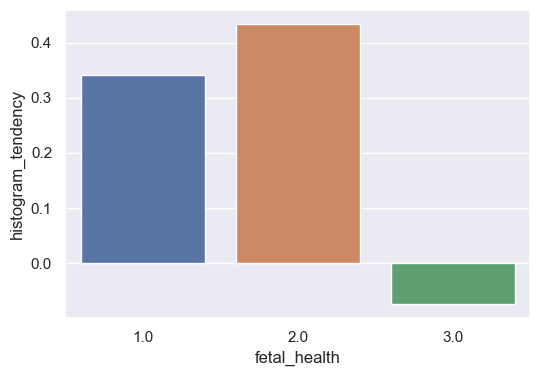

In [19]:
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
sns.set()
for index,i in enumerate(grouped.columns,start=1):
    plt.figure(figsize=(6,4))
    sns.barplot(data=grouped,x=grouped.index,y=grouped[i])
    plt.show()

### **<span style="color:#483D8B;">Oversampling of Minority Class</span>**

In [20]:
from imblearn.over_sampling import RandomOverSampler
oversample = RandomOverSampler(sampling_strategy='not majority')
X_over, y_over = oversample.fit_resample(X, y)

In [21]:
y_over

0       2.0
1       1.0
2       1.0
3       1.0
4       1.0
       ... 
4960    3.0
4961    3.0
4962    3.0
4963    3.0
4964    3.0
Name: fetal_health, Length: 4965, dtype: float64

In [22]:
X_over

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency
0,120.0,0.000,0.000,0.000,0.000,0.0,0.000,73.0,0.5,43.0,...,64.0,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0
1,132.0,0.006,0.000,0.006,0.003,0.0,0.000,17.0,2.1,0.0,...,130.0,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0
2,133.0,0.003,0.000,0.008,0.003,0.0,0.000,16.0,2.1,0.0,...,130.0,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0
3,134.0,0.003,0.000,0.008,0.003,0.0,0.000,16.0,2.4,0.0,...,117.0,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0
4,132.0,0.007,0.000,0.008,0.000,0.0,0.000,16.0,2.4,0.0,...,117.0,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4960,129.0,0.000,0.001,0.007,0.006,0.0,0.002,67.0,3.2,0.0,...,80.0,66.0,146.0,7.0,0.0,105.0,80.0,107.0,9.0,0.0
4961,131.0,0.000,0.375,0.000,0.000,0.0,0.004,80.0,0.3,0.0,...,49.0,96.0,145.0,3.0,0.0,108.0,125.0,128.0,45.0,1.0
4962,130.0,0.002,0.002,0.008,0.008,0.0,0.002,64.0,2.4,0.0,...,161.0,50.0,211.0,8.0,0.0,60.0,85.0,112.0,243.0,-1.0
4963,132.0,0.000,0.000,0.008,0.002,0.0,0.002,30.0,1.7,0.0,...,90.0,60.0,150.0,3.0,0.0,99.0,104.0,102.0,33.0,0.0


<AxesSubplot:xlabel='fetal_health', ylabel='count'>

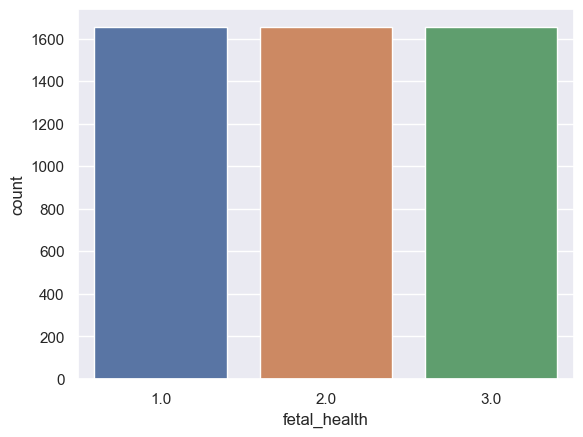

In [23]:
sns.countplot(data=pd.DataFrame(y_over),x='fetal_health')

In [24]:
data.columns

Index(['baseline value', 'accelerations', 'fetal_movement',
       'uterine_contractions', 'light_decelerations', 'severe_decelerations',
       'prolongued_decelerations', 'abnormal_short_term_variability',
       'mean_value_of_short_term_variability',
       'percentage_of_time_with_abnormal_long_term_variability',
       'mean_value_of_long_term_variability', 'histogram_width',
       'histogram_min', 'histogram_max', 'histogram_number_of_peaks',
       'histogram_number_of_zeroes', 'histogram_mode', 'histogram_mean',
       'histogram_median', 'histogram_variance', 'histogram_tendency',
       'fetal_health'],
      dtype='object')

In [25]:
col=['baseline value', 'fetal_movement', 'uterine_contractions', 'light_decelerations', 'severe_decelerations', 'prolongued_decelerations','abnormal_short_term_variability']
X_over=X_over[col]

***Now All the classes have same number of samples! Lets do some Dimensionality reduction to get more insights***

### **<span style="color:#483D8B;">Dimensionality Reduction and visualization</span>**

**<span style="color:#483D8B;">Scaling Data</span>**

In [26]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_scaled=scaler.fit_transform(X_over)

In [27]:
X_scaled=pd.DataFrame(X_scaled,columns=X_over.columns)
X_scaled.head()

,baseline value,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability
0,-1.488820,-0.231715,-1.142697,-0.625247,-0.105838,-0.461785,0.973128
1,-0.297924,-0.231715,0.738850,0.271273,-0.105838,-0.461785,-2.298123
2,-0.198683,-0.231715,1.366032,0.271273,-0.105838,-0.461785,-2.356538
3,-0.099441,-0.231715,1.366032,0.271273,-0.105838,-0.461785,-2.356538
4,-0.297924,-0.231715,1.366032,-0.625247,-0.105838,-0.461785,-2.356538


In [28]:
from sklearn.decomposition import PCA
pca=PCA(n_components=3) #getting 3 components with highest variance
X_pca=pca.fit_transform(X_scaled)
X_pca=pd.DataFrame(X_pca)
X_pca.head()

,0,1,2
0,-0.760957,-0.018021,0.914108
1,1.156334,-0.589781,-1.762536
2,1.421377,-0.748386,-2.051309
3,1.377444,-0.741742,-2.066562
4,1.000098,-0.559691,-2.238993


In [29]:
import plotly.express as px
fig = px.scatter_3d(X_pca, x=0, y=1, z=2,
              color=y_over, size_max=10)
fig.show()

Not much information by checking this graph!

In [30]:
from sklearn.decomposition import PCA
pca=PCA(n_components=0.95) #0.95 here refers that the total variance explained by the components must be atleast 95%
X_pca_final=pca.fit_transform(X_scaled)
X_pca_final=pd.DataFrame(X_pca_final)
X_pca_final.head()

,0,1,2,3,4,5,6
0,-0.760957,-0.018021,0.914108,0.188486,-1.865775,0.131639,0.435254
1,1.156334,-0.589781,-1.762536,1.048926,-0.012458,-0.017807,-0.612823
2,1.421377,-0.748386,-2.051309,0.912918,0.300716,0.095044,-0.298954
3,1.377444,-0.741742,-2.066562,0.897160,0.381867,0.082329,-0.324381
4,1.000098,-0.559691,-2.238993,1.138640,0.132945,0.732243,-0.015809


In [31]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X_pca_final,y_over,random_state=42,stratify=y_over)

# **<span style="color:#483D8B;">Modeling </span>**

In [32]:
from sklearn.model_selection import GridSearchCV
dt = DecisionTreeClassifier(random_state=42)

### **<span style="color:#483D8B;">Hyper-parameter tuning  </span>**

In [33]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

In [34]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [35]:
%%time
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 50 candidates, totalling 200 fits
CPU times: total: 1.2 s
Wall time: 14.2 s


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [36]:
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.027796,0.014099,0.009862,0.004093,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.675618,0.707841,0.672395,0.678495,0.683587,0.014168,41
1,0.021179,0.004076,0.010800,0.010602,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.675618,0.707841,0.672395,0.678495,0.683587,0.014168,41
2,0.027831,0.004093,0.007950,0.002868,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.675618,0.707841,0.672395,0.678495,0.683587,0.014168,41
3,0.016963,0.000732,0.004627,0.000349,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.675618,0.707841,0.672395,0.678495,0.683587,0.014168,41
4,0.018942,0.004933,0.004473,0.000813,gini,2,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.675618,0.707841,0.672395,0.678495,0.683587,0.014168,41


In [37]:
score_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
45,0.068368,0.018360,0.006676,0.001820,entropy,20,5,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.920516,0.895811,0.915145,0.913978,0.911363,0.009311,1
40,0.051505,0.004272,0.003129,0.000152,entropy,10,5,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.914071,0.890440,0.904404,0.916129,0.906261,0.010150,2
20,0.032600,0.002319,0.003911,0.000542,gini,20,5,"{'criterion': 'gini', 'max_depth': 20, 'min_sa...",0.907626,0.916219,0.894737,0.876344,0.898732,0.015017,3
15,0.049682,0.011912,0.004761,0.001184,gini,10,5,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.888292,0.906552,0.883996,0.867742,0.886645,0.013814,4
46,0.050488,0.006675,0.008097,0.005472,entropy,20,10,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.903330,0.876477,0.874329,0.866667,0.880201,0.013843,5


In [38]:
grid_search.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=20, min_samples_leaf=5,
                       random_state=42)

In [39]:
dt_best = grid_search.best_estimator_

In [40]:
evaluate_model(dt_best)

Train Accuracy : 0.9626645178619393
Train Confusion Matrix:
[[1155   59   27]
 [  26 1194   21]
 [   0    6 1235]]
--------------------------------------------------
Test Accuracy : 0.926731078904992
Test Confusion Matrix:
[[358  44  12]
 [ 22 380  12]
 [  0   1 413]]


a. What is the overall accuracy of the decision tree model?</br>
    Training accuracy is 96.4 % where as test accuracy is 93.2%
    
b.  Write  the  confusion  matrix.  Discuss  the  implications  of  Type-I  error  and  Type-II  error  in 
this example.</br>
confusion Matrix is above.</br>
Type I and Type II errors are very common in machine learning
Type I error occurs when the Null Hypothesis (H0) is mistakenly rejected. This is also referred to as the False Positive Error. 
Type II error occurs when a Null Hypothesis that is actually false is accepted. This is also referred to as the False Negative Error.

Apart from Diagonal Value in above confusion Matrix are type1 & type 2 error value.


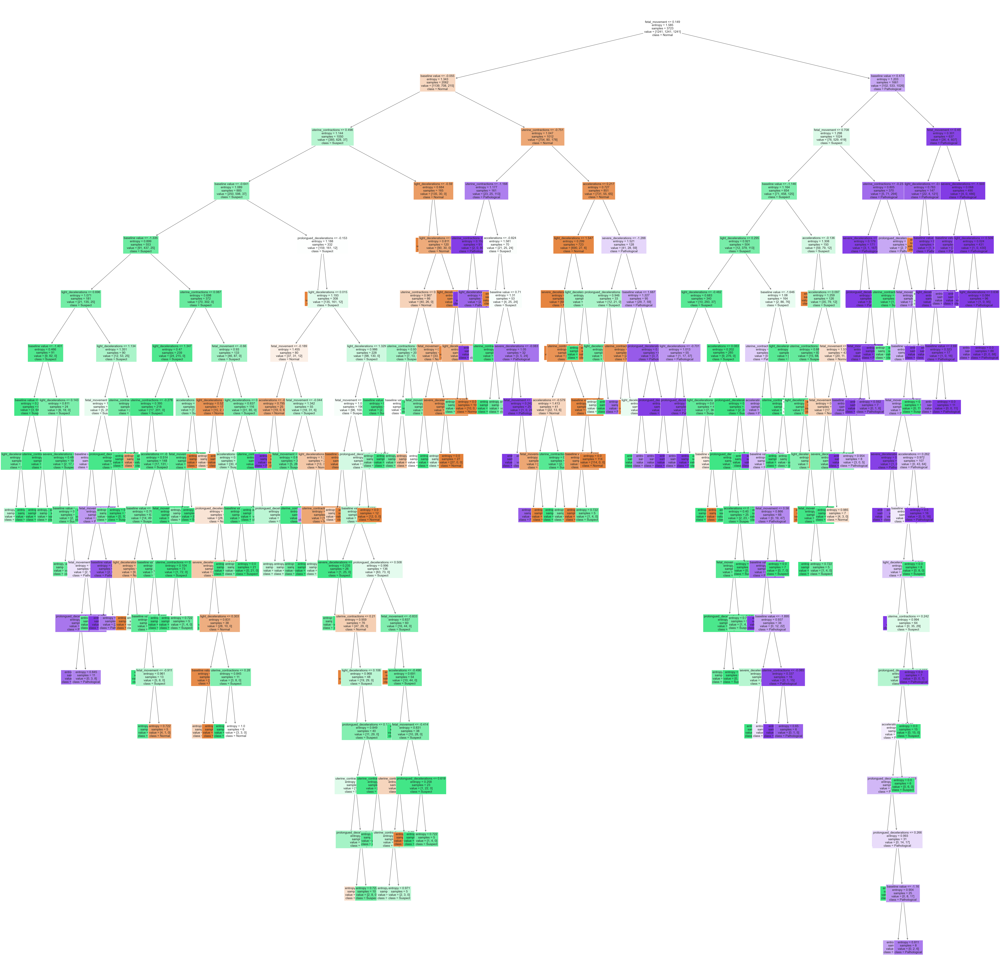

In [41]:
get_dt_graph(dt_best)

#### Q. What are the Precision, Recall, F1 score for the three classes, based on the confusion matrix?

In [42]:
print(classification_report(y_test, dt_best.predict(X_test)))

              precision    recall  f1-score   support

         1.0       0.94      0.86      0.90       414
         2.0       0.89      0.92      0.91       414
         3.0       0.95      1.00      0.97       414

    accuracy                           0.93      1242
   macro avg       0.93      0.93      0.93      1242
weighted avg       0.93      0.93      0.93      1242



### **<span style="color:#483D8B;">The ROC CURVE  </span>**

#### Plot the ROC curves for the three classes.

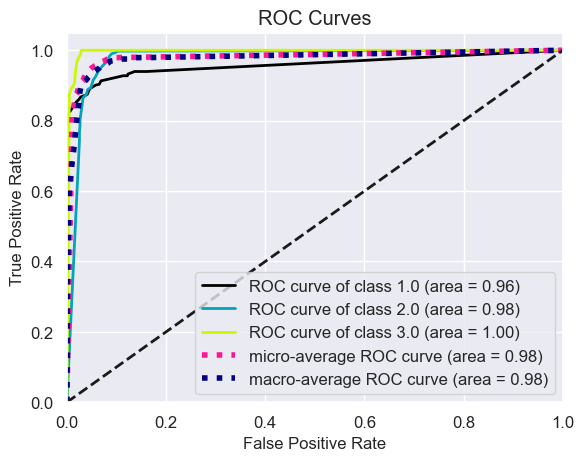

In [43]:
# The ROC AUC curve
import matplotlib.pyplot as plt
import scikitplot as skplt
predicted_probas = dt_best.predict_proba(X_test)
skplt.metrics.plot_roc(y_test, predicted_probas)
plt.show()

So Finally we have :</br>
DecisionTreeClassifier(criterion='entropy', max_depth=20, min_samples_leaf=5,
                       random_state=42)
with above Decision Tree Classifier we got 93% test accuracy , with more than .90 f1 score
above model have auc value above 0.96 .
finally from above score we can say that we have good model for prediction.